# 🚗 Electric Vehicle Price Prediction using SVM

---

## 📌 Project Overview

In this checkpoint, we aim to build a Support Vector Machine (SVM) model to predict the **expected price** of electric vehicles based on various features. We utilize the **Electric Vehicle Data** dataset from Kaggle, which includes both Battery Electric Vehicles (BEVs) and Plug-in Hybrid Electric Vehicles (PHEVs) registered in Washington State.

> 💡 The goal is to answer:  
> _"Given the car’s make, model, and other details, what is its estimated price?"_

---

![Electric Vehicle Banner](https://i.imgur.com/IpuCW3s.jpg)

## 📂 Dataset Description

This dataset originates from the Washington State Department of Licensing (DOL) and was part of an invitation-only Kaggle competition. 

---

## 🧾 Feature Overview

| Column Name | Description |
|-------------|-------------|
| **VIN (1-10)** | First 10 characters of the Vehicle Identification Number |
| **County** | Registered owner's county |
| **City** | Registered owner's city |
| **State** | Registered owner's state |
| **ZIP Code** | Owner's ZIP code (5-digit) |
| **Model Year** | Year of the vehicle model |
| **Make** | Vehicle manufacturer |
| **Model** | Vehicle model |
| **Electric Vehicle Type** | BEV or PHEV |
| **CAFV Eligibility** | Eligibility as a Clean Alternative Fuel Vehicle |
| **Electric Range** | Distance the car can travel on electric power alone |
| **Base MSRP** | Manufacturer’s Suggested Retail Price |
| **Legislative District** | WA State legislative district |
| **DOL Vehicle ID** | Unique ID assigned by the DOL |
| **Vehicle Location** | Center of the registered ZIP Code |
| **Electric Utility** | Power provider based on registration address |
| **Expected Price** | 💰 The target variable (in training set only) |

---

## 🧠 Machine Learning Objective

- **Task**: Supervised Regression
- **Model**: Support Vector Regression (SVR)
- **Target Variable**: `Expected Price`
- **Evaluation Metric**: Typically RMSE or MAE

---

## 🛠️ Steps to Follow

1. **Load and explore the dataset**
2. **Preprocess the data**: handle missing values, encode categorical features, etc.
3. **Feature Engineering**: Create new features if beneficial
4. **Split the training set**: training and validation sets
5. **Train the SVM model**: Use `sklearn.svm.SVR`
6. **Hyperparameter tuning**: e.g., GridSearchCV
7. **Make predictions** on the test set
8. **Prepare the submission file** using `sample_submission.csv`

---

## 📌 Notes

- Feature selection and scaling are **critical** for SVR performance.
- Consider testing kernel types: `'linear'`, `'poly'`, `'rbf'`, etc.
- Be cautious of **high cardinality** features like VIN or Vehicle ID — these may not be helpful.
- Use **Pipelines** for cleaner preprocessing and modeling.

---

## 📎 Resources

- 📘 [Scikit-learn: Support Vector Regression](https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVR.html)  
- 🧮 [Electric Vehicle Dataset Description](https://catalog.data.gov/dataset/electric-vehicle-population-data)

---


In [1]:
import numpy as np
import pandas as pd
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
from ydata_profiling import ProfileReport
from sklearn.model_selection import train_test_split
from sklearn.svm import LinearSVC, SVC, NuSVC
from sklearn.metrics import accuracy_score
from sklearn.model_selection import StratifiedKFold, cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

In [2]:
# Import the dataset
df = pd.read_csv('Electric_cars_dataset.csv')

### **1️⃣ Data Exploration & Preprocessing**

In [3]:
# Display general information about the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64353 entries, 0 to 64352
Data columns (total 18 columns):
 #   Column                                             Non-Null Count  Dtype  
---  ------                                             --------------  -----  
 0   ID                                                 64353 non-null  object 
 1   VIN (1-10)                                         64353 non-null  object 
 2   County                                             64349 non-null  object 
 3   City                                               64344 non-null  object 
 4   State                                              64342 non-null  object 
 5   ZIP Code                                           64347 non-null  float64
 6   Model Year                                         64346 non-null  float64
 7   Make                                               64349 non-null  object 
 8   Model                                              64340 non-null  object 
 9   Electr

## 🧹 Dropping Irrelevant or Non-informative Columns

Some features in the dataset do **not contribute useful information** for predicting the vehicle's price. They may act as identifiers, have too much randomness, or contain high-cardinality categorical data with little predictive power. Here's what we recommend dropping:

### 🔻 Columns to Drop

| Column Name            | Reason for Dropping |
|------------------------|---------------------|
| **VIN (1-10)**          | High-cardinality, almost unique per vehicle; not generalizable. |
| **DOL Vehicle ID**      | Internal identifier used by the licensing agency; not meaningful for price prediction. |
| **Vehicle Location**    | Geographic centroid (lat/long) of ZIP Code, but too granular and may add noise. |
| **Electric Utility**    | Power provider name is highly regional and not likely to impact price. |
| **State**               | All values are expected to be "WA" (Washington), so it's a constant. |

 These columns are either identifiers, administrative metadata, or overly noisy for a regression model.

---

In [4]:
columns_to_drop = [
    'VIN (1-10)',
    'DOL Vehicle ID',
    'Vehicle Location',
    'Electric Utility',
    'State'
]

df.drop(columns=columns_to_drop, inplace=True)

In [5]:
# change the column Expected Price ($1k) type to float, handling non-numeric values
df['Expected Price ($1k)'] = pd.to_numeric(df['Expected Price ($1k)'].str.replace('₹', '').str.replace(',', ''), errors='coerce')

In [6]:
# display the first few rows of the dataset
df.head()

,ID,County,City,ZIP Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,Expected Price ($1k)
0,EV33174,Snohomish,LYNNWOOD,98037.0,2020.0,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,308,0,32.0,50.00
1,EV40247,Skagit,BELLINGHAM,98229.0,2011.0,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,73,0,40.0,15.00
2,EV12248,Pierce,TACOMA,98422.0,2015.0,BMW,I3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,81,0,27.0,18.00
3,EV55713,King,REDMOND,98053.0,2013.0,CHEVROLET,VOLT,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,38,0,45.0,33.90
4,EV28799,Pierce,PUYALLUP,98375.0,2019.0,CHEVROLET,BOLT EV,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,238,0,25.0,41.78


In [7]:
# Display the statistics of the dataset
df.describe()

,ZIP Code,Model Year,Electric Range,Base MSRP,Legislative District,Expected Price ($1k)
count,64347.000000,64346.000000,64353.000000,64353.000000,64184.000000,64340.000000
mean,98143.452888,2018.186212,106.948985,2524.990754,29.951904,45.447970
std,2856.064329,2.726742,104.093919,12402.895104,14.661124,24.728205
min,745.000000,1993.000000,0.000000,0.000000,0.000000,0.000000
25%,98052.000000,2017.000000,14.000000,0.000000,19.000000,22.857000
50%,98121.000000,2018.000000,73.000000,0.000000,34.000000,40.000000
75%,98370.000000,2021.000000,215.000000,0.000000,43.000000,65.900000
max,99701.000000,2022.000000,337.000000,845000.000000,49.000000,1100.000000


In [8]:
# Create a pandas profiling reports to gain insights into the dataset
profile = ProfileReport(df, title="Pandas Profiling Report", explorative=True)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [9]:
# Drop the ID column 
df.drop(columns=['ID'], inplace=True)


In [10]:
# display the 4 missing values in Country column
missing_counties = df[df['County'].isnull()]


## 📌 Dropping Military Address Entries (APO / FPO)

During data preprocessing, we identified four rows with missing values in the `County` column, corresponding to the following ZIP codes and cities:

| City | ZIP Code |
|------|----------|
| APO  | 9751.0   |
| FPO  | 96349.0  |
| FPO  | 96678.0  |
| FPO  | 96662.0  |

These ZIP codes (09751, 96349, 96678, 96662) are designated for **military addresses**, specifically:

- **APO (Army Post Office)** and  
- **FPO (Fleet Post Office)**  

These addresses serve U.S. military personnel stationed abroad, often in Europe, Asia, or on naval fleets, and **do not correspond to any standard U.S. county or state**.

### 🔍 Why Drop These Entries?

1. **Lack of Geographical Context**  
   These rows do not provide meaningful location-based information like county, ZIP code mapping, or utility services relevant to Washington State — the region covered by this dataset.

2. **Cannot Be Imputed Reliably**  
   Since these addresses are not tied to a specific U.S. location, we cannot use `City` or `ZIP Code` to impute missing `County` or `Legislative District` values.

3. **Irrelevant to Price Modeling in Washington**  
   Our modeling goal is to predict EV prices based on features specific to Washington State. Including out-of-region or special-use data (like APO/FPO) may introduce noise.

4. **Minimal Data Loss**  
   These rows represent **only 4 out of 64,353 entries (~0.006%)**, so removing them has negligible impact on the dataset’s integrity or the model’s performance.


In [11]:
# droping the rows with missing values in the County column
df.dropna(subset=['County'], inplace=True)

## 🧹 Handling The Rest Of Missing Values 

Below is a summary of how we will address missing values in each column based on their count and the nature of the data:

| Column                                             | Missing Count | Strategy                                                                 |
|----------------------------------------------------|---------------|--------------------------------------------------------------------------|
| `County`                                           | 0             | ✅ No action needed. Clean after removing APO/FPO entries.               |
| `City`                                             | 9             | 🔄 Impute using `ZIP Code` or `County` if available, otherwise drop.     |
| `ZIP Code`                                         | 6             | 🔄 Impute using `City` + `County`, or drop if city is also missing.      |
| `Model Year`                                       | 7             | 🔄 Impute using most frequent year by `Make` and `Model`.                |
| `Make`                                             | 4             | 🔄 We found the company that made those exact models and implented them in the dataset  |
| `Model`                                            | 13            | ⚠️ Drop rows — cannot accurately impute.                  |
| `Electric Vehicle Type`                            | 0             | ✅ No action needed.                                                     |
| `Clean Alternative Fuel Vehicle (CAFV) Eligibility`| 0             | ✅ No action needed.                                                     |
| `Electric Range`                                   | 0             | ✅ No action needed.                                                     |
| `Base MSRP`                                        | 0             | ✅ No action needed.                                                     |
| `Legislative District`                             | 165           | 🔄  Impute based on `ZIP Code` using external API or drop ifnot critical.|
| `Expected Price ($1k)`                             | 13            | 🔄 Predict using regression or impute with median grouped by Make/Model. |

### 📝 Notes:

- **Imputation Methods:**
  - For `ZIP Code`, `City`, and `County`, we can use the [`uszipcode`](https://pypi.org/project/uszipcode/) library to cross-reference missing values.
  - For `Model Year`, group data by `Make` and `Model` and impute with the most common year.
  - For `Expected Price`, predictive imputation (e.g., linear regression or kNN) may be more accurate than mean/median.

- **Drop Criteria:**
  - Rows missing `Make` or `Model` are dropped because these fields are essential for any meaningful prediction.

- **Final Tip:**
  Always perform missing value treatment **after exploratory analysis** and ensure to track any rows removed to validate modeling consistency.


In [12]:
# display the count of missing values in each column
df.isnull().sum()

County                                                 0
City                                                   9
ZIP Code                                               6
Model Year                                             7
Make                                                   4
Model                                                 13
Electric Vehicle Type                                  0
Clean Alternative Fuel Vehicle (CAFV) Eligibility      0
Electric Range                                         0
Base MSRP                                              0
Legislative District                                 165
Expected Price ($1k)                                  13
dtype: int64

In [13]:
# impute the city column with the zip code
df['City'].fillna(df['ZIP Code'], inplace=True)

C:\Users\pc\AppData\Local\Temp\ipykernel_14176\3177435679.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['City'].fillna(df['ZIP Code'], inplace=True)


In [14]:
# drop the rows with missing values in the 'ZIP Code' column
df.dropna(subset=['ZIP Code'], inplace=True)

In [15]:
# hundle the missing values in the 'Model Year' by imputeing it with columns 'Make' and 'Model'
df['Model Year'].fillna(df.groupby(['Make', 'Model'])['Model Year'].transform('mean'), inplace=True)

C:\Users\pc\AppData\Local\Temp\ipykernel_14176\296222723.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['Model Year'].fillna(df.groupby(['Make', 'Model'])['Model Year'].transform('mean'), inplace=True)


In [16]:
# display the missing values in the 'Make' column 
missing_make = df[df['Make'].isnull()]
missing_make

,County,City,ZIP Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,Expected Price ($1k)
23333,Thurston,OLYMPIA,98501.0,2012.0,NaN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,73,0,35.0,17.00
27605,King,NEWCASTLE,98059.0,2021.0,NaN,MODEL 3,Battery Electric Vehicle (BEV),Eligibility unknown as battery range has not b...,0,0,41.0,64.00
55367,Whatcom,BELLINGHAM,98229.0,2021.0,NaN,NIRO,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,26,0,40.0,24.69
59308,Clark,WASHOUGAL,98671.0,2022.0,NaN,SORENTO,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,32,0,18.0,29.49


In [17]:
### 🧩 Filling Missing 'Make' Values Based on 'Model' ###

# Define a mapping from known models to their corresponding makes
model_to_make = {
    'LEAF': 'NISSAN',
    'MODEL 3': 'TESLA',
    'NIRO': 'KIA',
    'SORENTO': 'KIA'
}

# Apply the mapping to fill missing 'Make' values where 'Model' is known
df['Make'] = df.apply(
    lambda row: model_to_make[row['Model']] if pd.isna(row['Make']) and row['Model'] in model_to_make else row['Make'],
    axis=1
)

# ✅ Confirmation
print("Remaining missing values in 'Make':", df['Make'].isna().sum())


Remaining missing values in 'Make': 0


In [18]:
# drop the rows with missing values in the 'Model' column
df.dropna(subset=['Model'], inplace=True)
# ✅ Confirmation
print("Remaining missing values in 'Model':", df['Model'].isna().sum())

Remaining missing values in 'Model': 0


In [19]:
# the first methode didn't work so we will use the second one we'll drop the missing values in the 'Legislative District' column
df.dropna(subset=['Legislative District'], inplace=True)
# ✅ Confirmation
print("Remaining missing 'Legislative District':", df['Legislative District'].isna().sum())

Remaining missing 'Legislative District': 0


In [20]:
# drop the rows with missing values in the 'Expected Price ($1k)' column
df.dropna(subset=['Expected Price ($1k)'], inplace=True)
# ✅ Confirmation
print("Remaining missing 'Expected Price ($1k)':", df['Expected Price ($1k)'].isna().sum())

Remaining missing 'Expected Price ($1k)': 0


In [21]:
# checking for the missing values in the dataset 
df.isnull().sum()

County                                               0
City                                                 0
ZIP Code                                             0
Model Year                                           0
Make                                                 0
Model                                                0
Electric Vehicle Type                                0
Clean Alternative Fuel Vehicle (CAFV) Eligibility    0
Electric Range                                       0
Base MSRP                                            0
Legislative District                                 0
Expected Price ($1k)                                 0
dtype: int64

In [22]:
# remove the zeros from the 'Expected Price ($1k)' column
df = df[df['Expected Price ($1k)'] != 0]
# ✅ Confirmation
print("Remaining zeros in 'Expected Price ($1k)':", df[df['Expected Price ($1k)'] == 0].shape[0]) 

Remaining zeros in 'Expected Price ($1k)': 0


In [23]:
# Create a pandas profiling reports to gain insights into the dataset
profile = ProfileReport(df, title="Pandas Profiling Report", explorative=True)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [24]:
# City column is unsupported so we'll change it to categorical
df['City'] = df['City'].astype('category')

In [25]:
# treating ZIP Code as a categorical variable rather than numeric.
df['ZIP Code'] = df['ZIP Code'].astype(str)

In [26]:
# drop the column 'Base MSRP' as it is not needed for the analysis since it has a lot of zeros
df.drop(columns=['Base MSRP'], inplace=True)

In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 64163 entries, 0 to 64352
Data columns (total 11 columns):
 #   Column                                             Non-Null Count  Dtype   
---  ------                                             --------------  -----   
 0   County                                             64163 non-null  object  
 1   City                                               64163 non-null  category
 2   ZIP Code                                           64163 non-null  object  
 3   Model Year                                         64163 non-null  float64 
 4   Make                                               64163 non-null  object  
 5   Model                                              64163 non-null  object  
 6   Electric Vehicle Type                              64163 non-null  object  
 7   Clean Alternative Fuel Vehicle (CAFV) Eligibility  64163 non-null  object  
 8   Electric Range                                     64163 non-null  int64   
 9   

In [28]:
# encode the categorical variables 'Electric Vehicle Type' 'Clean Alternative Fuel Vehicle (CAFV) Eligibility' using one-hot encoding
df = pd.get_dummies(df, columns=['Electric Vehicle Type', 'Clean Alternative Fuel Vehicle (CAFV) Eligibility'], drop_first=True)
# ✅ Confirmation
print("Remaining categorical variables:", df.select_dtypes(include=['object']).columns.tolist())


Remaining categorical variables: ['County', 'ZIP Code', 'Make', 'Model']


In [29]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 64163 entries, 0 to 64352
Data columns (total 12 columns):
 #   Column                                                                                                          Non-Null Count  Dtype   
---  ------                                                                                                          --------------  -----   
 0   County                                                                                                          64163 non-null  object  
 1   City                                                                                                            64163 non-null  category
 2   ZIP Code                                                                                                        64163 non-null  object  
 3   Model Year                                                                                                      64163 non-null  float64 
 4   Make                                   

In [30]:
# we're gonna drop the zip code column we'll be using the city and county columns instead
df.drop(columns=['ZIP Code'], inplace=True) 

In [31]:
# List of categorical columns to frequency encode
categorical_columns = ['Make', 'Model', 'City', 'County']

# Apply frequency encoding
for col in categorical_columns:
    # Step 1: Compute the frequency of each category in the column
    frequency_map = df[col].value_counts().to_dict()
    
    # Step 2: Map the original column to its frequency
    df[f'{col}_FreqEnc'] = df[col].map(frequency_map)

# drop the original categorical columns if you no longer need them
df.drop(columns=categorical_columns, inplace=True)

# Display the first few rows of the DataFrame to check the new frequency encoded columns
df.head()



,Model Year,Electric Range,Legislative District,Expected Price ($1k),Electric Vehicle Type_Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle (CAFV) Eligibility_Eligibility unknown as battery range has not been researched,Clean Alternative Fuel Vehicle (CAFV) Eligibility_Not eligible due to low battery range,Make_FreqEnc,Model_FreqEnc,City_FreqEnc,County_FreqEnc
0,2020.0,308,32.0,50.00,False,False,False,27827,13092,831,6918
1,2011.0,73,40.0,15.00,False,False,False,8667,8667,1186,779
2,2015.0,81,27.0,18.00,False,False,False,2698,1320,1434,4822
3,2013.0,38,45.0,33.90,True,False,False,6633,3407,2448,33546
4,2019.0,238,25.0,41.78,False,False,False,6633,3038,586,4822


In [32]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 64163 entries, 0 to 64352
Data columns (total 11 columns):
 #   Column                                                                                                          Non-Null Count  Dtype  
---  ------                                                                                                          --------------  -----  
 0   Model Year                                                                                                      64163 non-null  float64
 1   Electric Range                                                                                                  64163 non-null  int64  
 2   Legislative District                                                                                            64163 non-null  float64
 3   Expected Price ($1k)                                                                                            64163 non-null  float64
 4   Electric Vehicle Type_Plug-in Hybrid Electric

In [33]:
# rename certain columns for clarity
df.rename(columns={
    'Electric Vehicle Type_Plug-in Hybrid Electric Vehicle (PHEV)': 'Is_PHEV',
    'Clean Alternative Fuel Vehicle (CAFV) Eligibility_Not eligible due to low battery range': 'CAFV_NotEligibleLowRange',
    'Clean Alternative Fuel Vehicle (CAFV) Eligibility_Eligibility unknown as battery range has not been researched': 'CAFV_UnknownEligibility'
}, inplace=True)


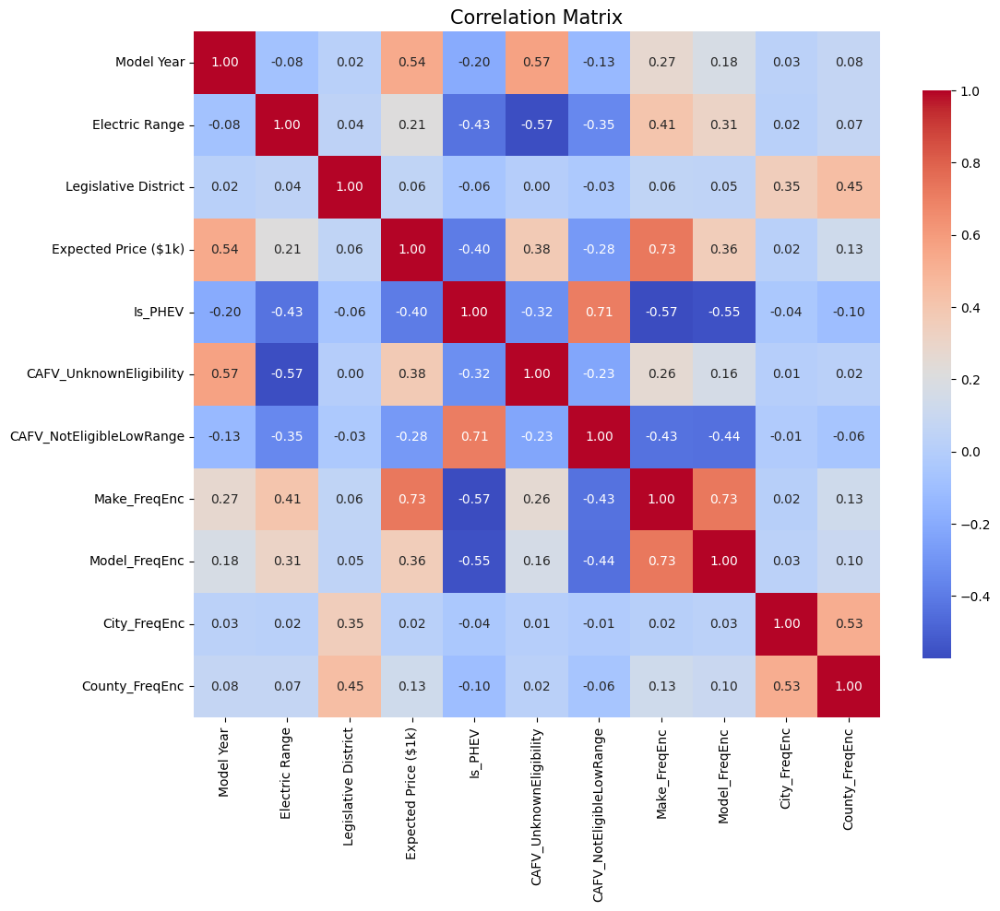

In [34]:
# display the correlation matrix
corr = df.corr()
plt.figure(figsize=(12, 10))
sns.heatmap(corr, annot=True, fmt=".2f", cmap='coolwarm', square=True, cbar_kws={"shrink": .8})
plt.title('Correlation Matrix', size=15)
plt.show()

In [35]:
# check for skewness in the dataset
from scipy.stats import skew
features = df.columns[:-1]  # Exclude the target variable 'Outcome'
df[features] = df[features].astype('float')

normal_cols = []
skewed_cols = []

for col in features:
    col_data = df[col].dropna()
    col_skew = skew(col_data)
    
    if abs(col_skew) < 0.5:
        normal_cols.append(col)
        print(f"{col}: Normal-ish (skew={col_skew:.2f})")
    else:
        skewed_cols.append(col)
        print(f"{col}: Skewed (skew={col_skew:.2f})")

Model Year: Skewed (skew=-0.68)
Electric Range: Skewed (skew=0.51)
Legislative District: Skewed (skew=-0.55)
Expected Price ($1k): Skewed (skew=2.47)
Is_PHEV: Skewed (skew=1.12)
CAFV_UnknownEligibility: Skewed (skew=1.27)
CAFV_NotEligibleLowRange: Skewed (skew=1.99)
Make_FreqEnc: Normal-ish (skew=0.16)
Model_FreqEnc: Normal-ish (skew=0.38)
City_FreqEnc: Skewed (skew=1.48)


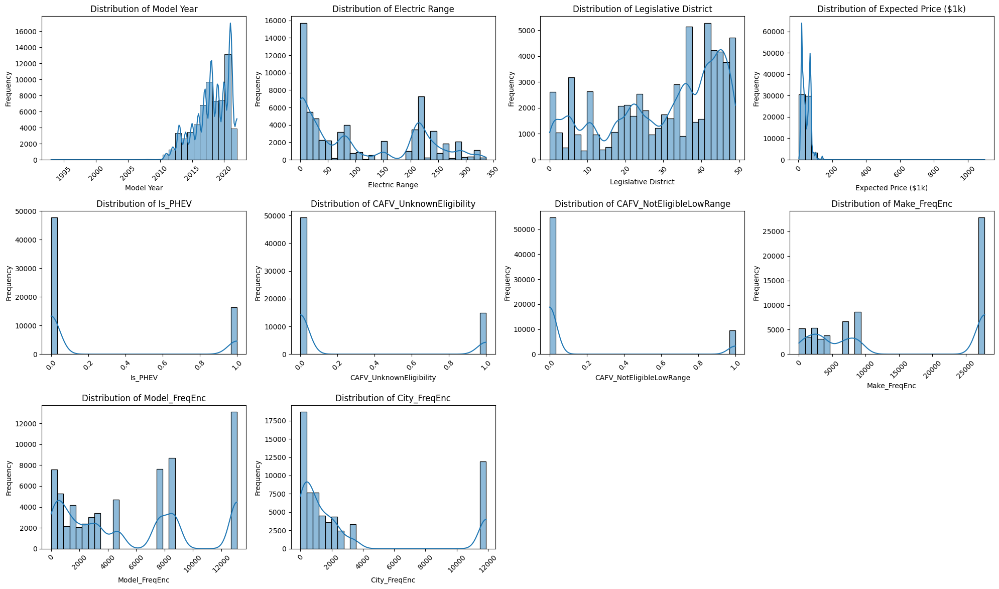

In [36]:
# plot histogramms for all features in one big plot
plt.figure(figsize=(20, 15))
plt.subplots_adjust(hspace=0.5, wspace=0.5)
for i, col in enumerate(features):
    plt.subplot(4, 4, i + 1)  # Adjust the number of rows and columns as needed
    sns.histplot(df[col], bins=30, kde=True)
    plt.title(f"Distribution of {col}")
    plt.xlabel(col)
    plt.ylabel("Frequency")
    plt.xticks(rotation=45)
    plt.tight_layout()
plt.show()


    

In [37]:
# Apply log transformation to skewed columns
for col in skewed_cols:
    df[col] = np.log1p(df[col])
    print(f"Applied log transformation to {col}")

Applied log transformation to Model Year
Applied log transformation to Electric Range
Applied log transformation to Legislative District
Applied log transformation to Expected Price ($1k)
Applied log transformation to Is_PHEV
Applied log transformation to CAFV_UnknownEligibility
Applied log transformation to CAFV_NotEligibleLowRange
Applied log transformation to City_FreqEnc


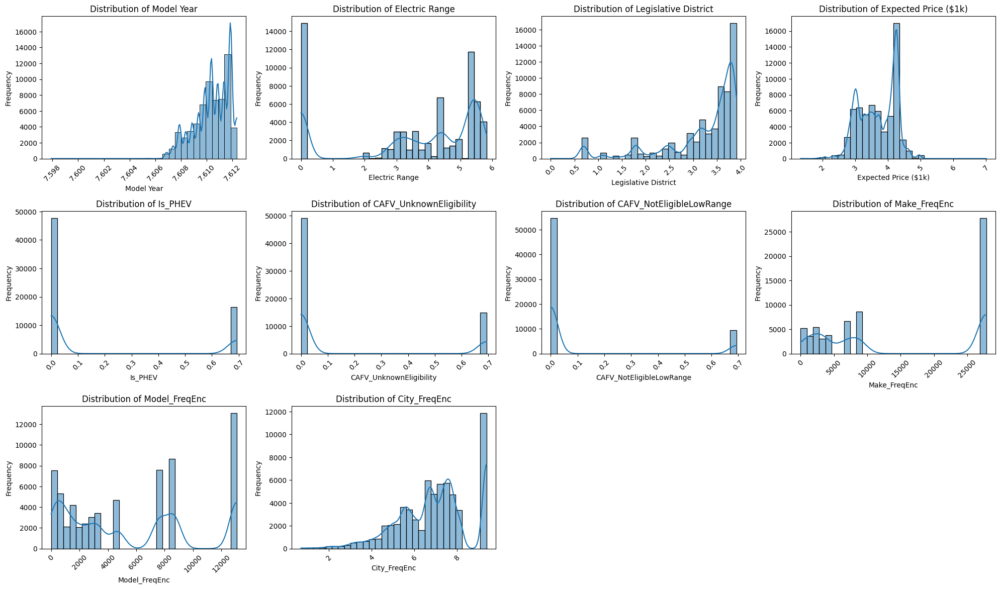

In [38]:
# plot histogramms for all features in one big plot
plt.figure(figsize=(20, 15))
plt.subplots_adjust(hspace=0.5, wspace=0.5)
for i, col in enumerate(features):
    plt.subplot(4, 4, i + 1)  # Adjust the number of rows and columns as needed
    sns.histplot(df[col], bins=30, kde=True)
    plt.title(f"Distribution of {col}")
    plt.xlabel(col)
    plt.ylabel("Frequency")
    plt.xticks(rotation=45)
    plt.tight_layout()
plt.show()

### **2️⃣ Model Selection & Training**

In [39]:
# split the dataset into features and target variable 'Expected Price ($1k)'
X = df.drop(columns=['Expected Price ($1k)'])
y = df['Expected Price ($1k)']

In [40]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.svm import SVR
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score

# 1. Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# 2. Create a pipeline with scaling and SVR
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('svr', SVR())
])

In [41]:
# # Train the SVR model with Polynomial kernel
# svr_poly = SVR(kernel='poly', C=10, gamma=0.1)
# svr_poly.fit(X_train, y_train)

# # Predict on the test set
# y_pred_poly = svr_poly.predict(X_test)

# # Evaluate the model using mean squared error and R-squared score
# mse_poly = mean_squared_error(y_test, y_pred_poly)
# r2_poly = r2_score(y_test, y_pred_poly)
# print(f"SVR (Polynomial) Mean Squared Error: {mse_poly:.2f}")
# print(f"SVR (Polynomial) R-squared Score: {r2_poly:.2f}")


# Train the model 

In [42]:
# With the kernal rbf C=10 and gamma=0.1
svr_rbf = SVR(kernel='rbf', C=10, gamma=0.1)
svr_rbf.fit(X_train, y_train)
# Predict on the test set
y_pred_rbf = svr_rbf.predict(X_test)
# Evaluate the model using mean squared error and R-squared score
mse_rbf = mean_squared_error(y_test, y_pred_rbf)
r2_rbf = r2_score(y_test, y_pred_rbf)
print(f"SVR (RBF) Mean Squared Error: {mse_rbf:.2f}")
print(f"SVR (RBF) R-squared Score: {r2_rbf:.2f}")

# With the kernal sigmoid C=10 and gamma=0.1
svr_sigmoid = SVR(kernel='sigmoid', C=10, gamma=0.1)
svr_sigmoid.fit(X_train, y_train)
# Predict on the test set
y_pred_sigmoid = svr_sigmoid.predict(X_test)
# Evaluate the model using mean squared error and R-squared score   
mse_sigmoid = mean_squared_error(y_test, y_pred_sigmoid)
r2_sigmoid = r2_score(y_test, y_pred_sigmoid)
print(f"SVR (Sigmoid) Mean Squared Error: {mse_sigmoid:.2f}")
print(f"SVR (Sigmoid) R-squared Score: {r2_sigmoid:.2f}")


SVR (RBF) Mean Squared Error: 0.03
SVR (RBF) R-squared Score: 0.89
SVR (Sigmoid) Mean Squared Error: 0.32
SVR (Sigmoid) R-squared Score: -0.01


In [43]:
# Here we'll be using a simple binned predictions
# Convert the continuous target variable into discrete classes (binning)
y_train_binned = pd.cut(y_train, bins=3, labels=["Low", "Medium", "High"])
y_test_binned = pd.cut(y_test, bins=3, labels=["Low", "Medium", "High"])

# polynomial kernel
poly_clf = SVC(kernel='poly', degree=3, C=1.0, gamma='scale', random_state=42)
poly_clf.fit(X_train, y_train_binned)
y_pred_poly = poly_clf.predict(X_test)
acc_poly = accuracy_score(y_test_binned, y_pred_poly)
print(f"SVC (Poly) Accuracy: {acc_poly:.2f}")

SVC (Poly) Accuracy: 0.79
